In [1]:
import rff

import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import os
import math

from PIL import Image
from torchvision.transforms import Resize, Compose, ToTensor, Normalize
import numpy as np
import skimage
import matplotlib.pyplot as plt

import time

def get_mgrid(sidelen, dim=2, device='cpu'):
    '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int'''
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen, device=device)])
    mgrid = torch.stack(torch.meshgrid(*tensors, indexing='ij'), dim=-1)
    mgrid = mgrid.reshape(-1, dim)
    return mgrid

import plotly.express as px
import pandas as pd

def to_np(t):
    a = t.detach().flatten().cpu().numpy()
    a = np.random.choice(a, size=1_000, replace=False)
    return a


def U(*shape):
    x = torch.rand(*shape)
    x = (x-0.5)*2.
    return x

import lovely_tensors as lt
lt.monkey_patch()

Properties that I want:

- trainworthy forward without redundancies
- full-fledged forward with all intermediate activations
- method to automatically init for
  - uniform input
  - posenc input

# Define network

# Standard init

In [2]:
in_features = 2
hidden_features = 64
hidden_layers = 1
out_features = 1
outermost_linear=True

In [3]:
from splitnet import SplitNet, SplitNetManager

In [4]:
from splitnet import *

In [5]:
from splitnet import SplitNet, SplitNetManager

In [6]:
net = SplitNet(hidden_layers=6, hidden_features=512)
man = SplitNetManager(net)

In [7]:
x = U(2_000, 2)

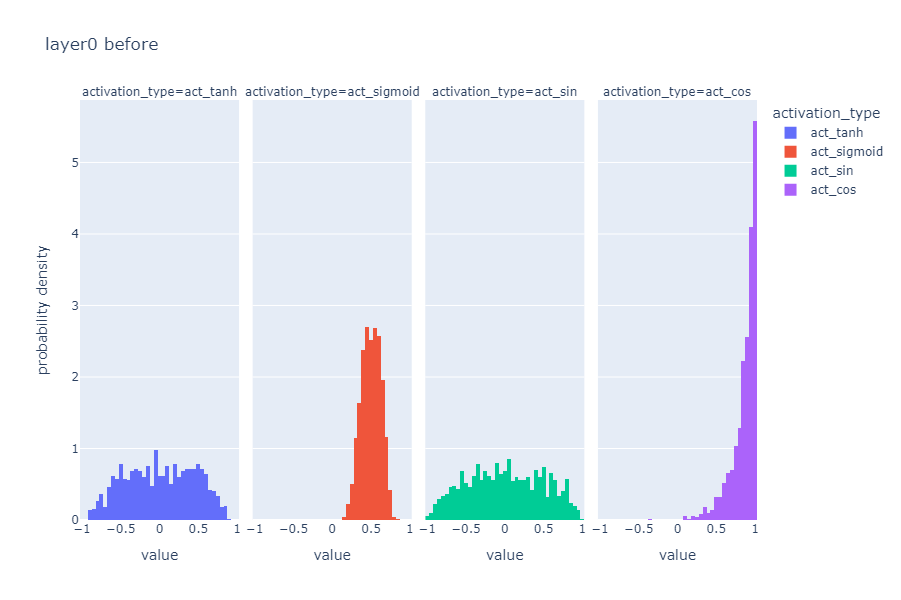

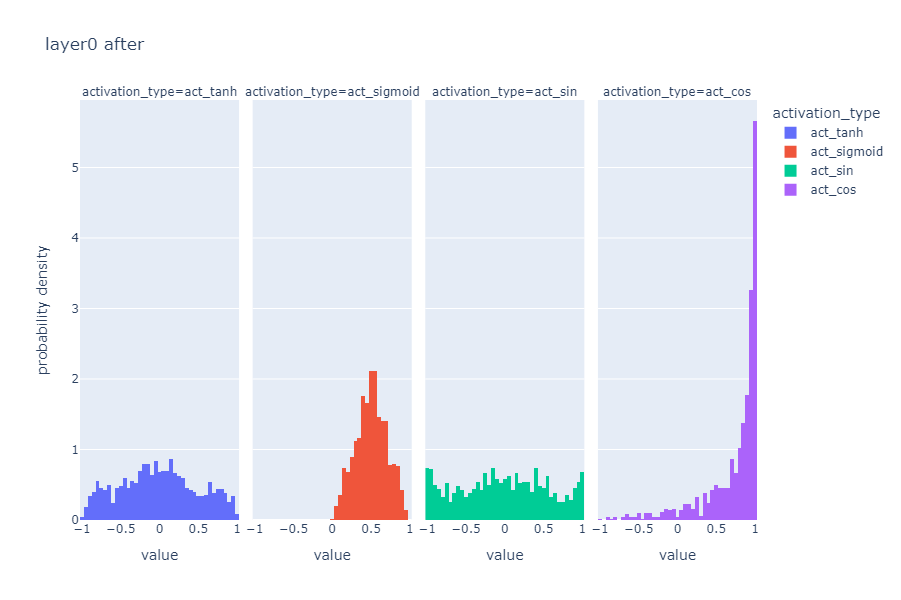

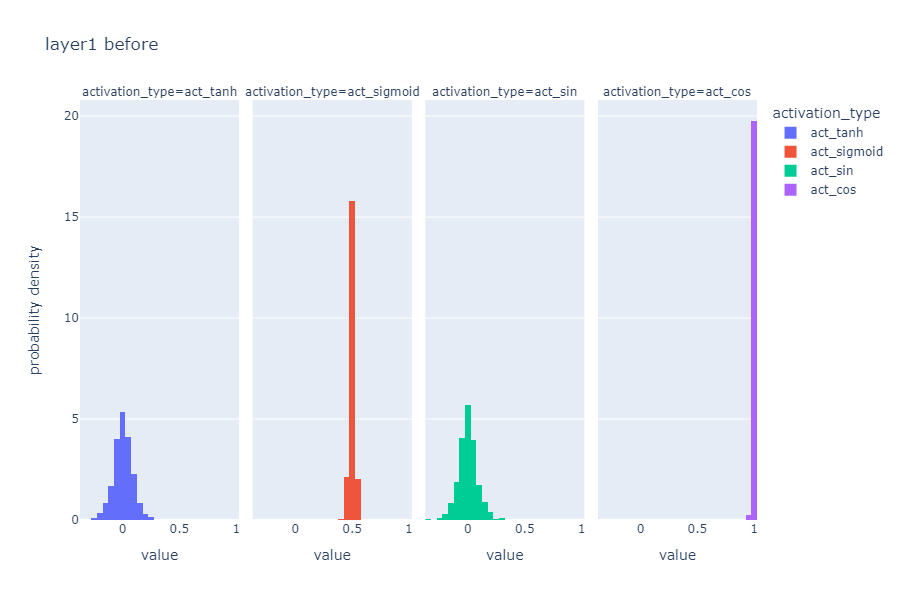

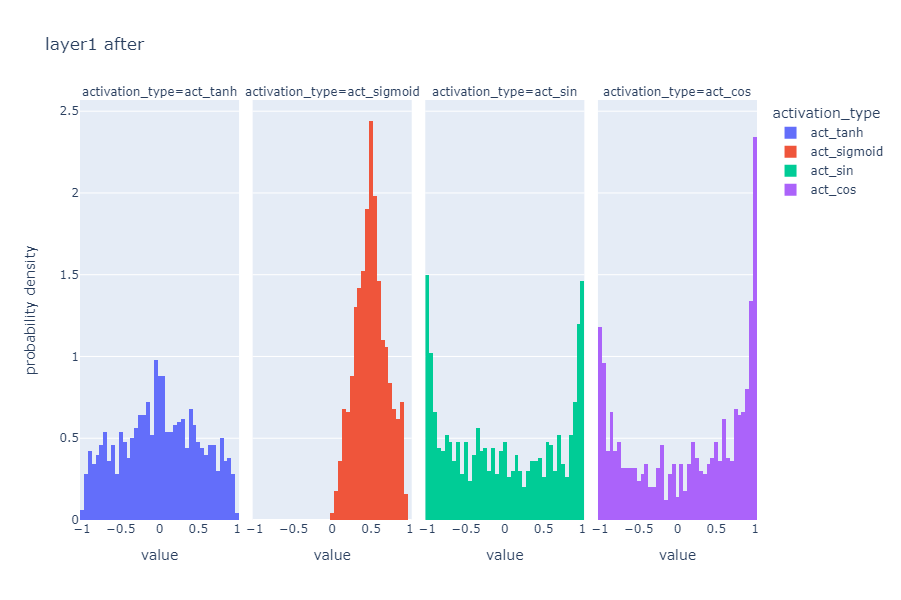

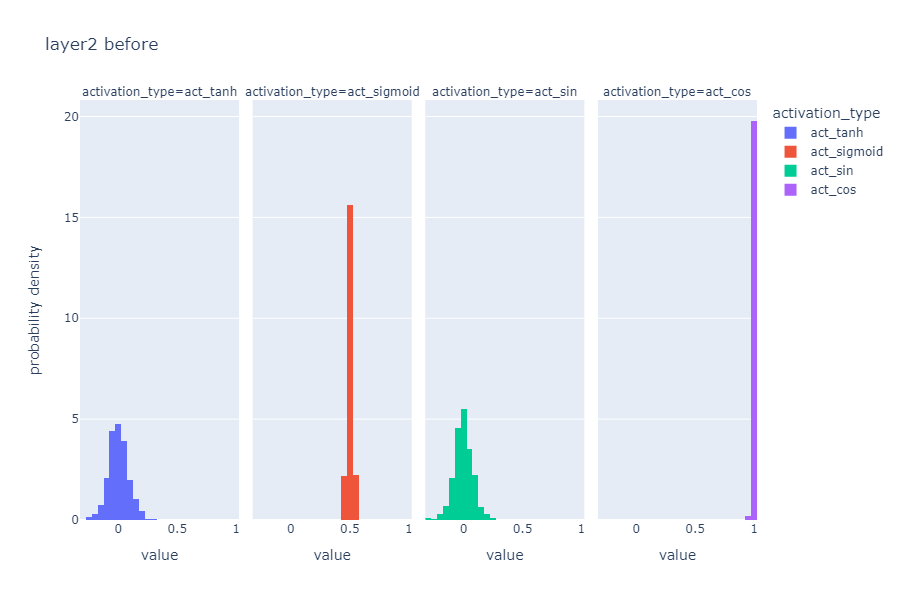

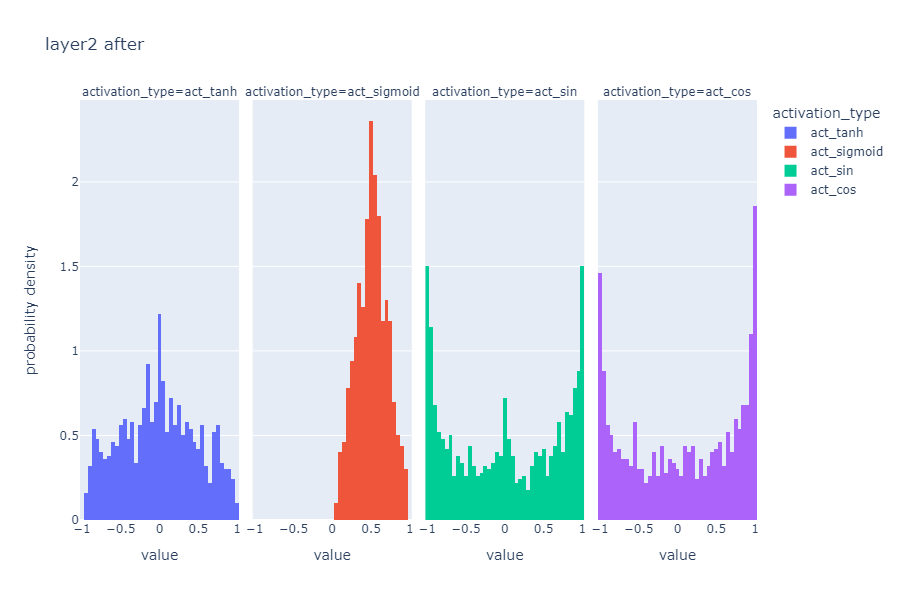

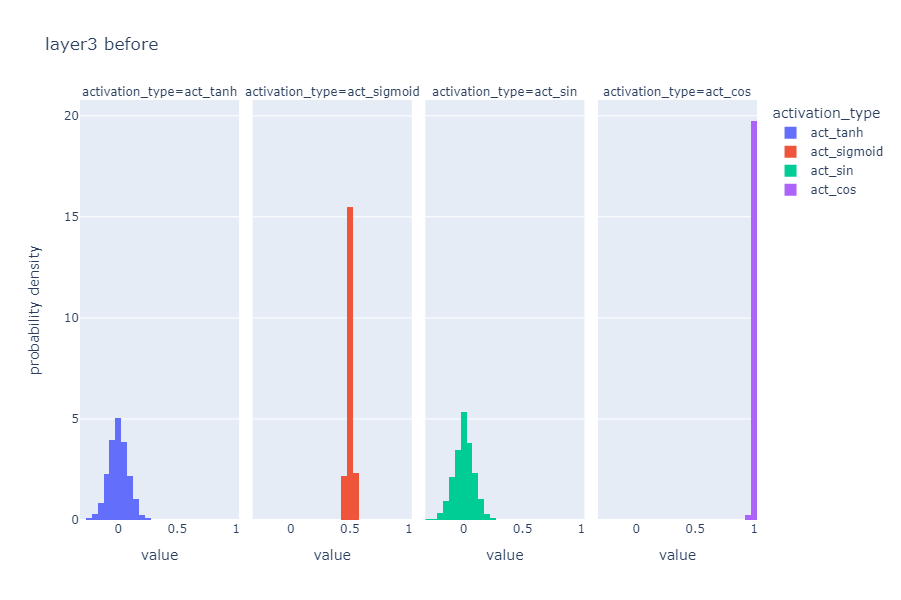

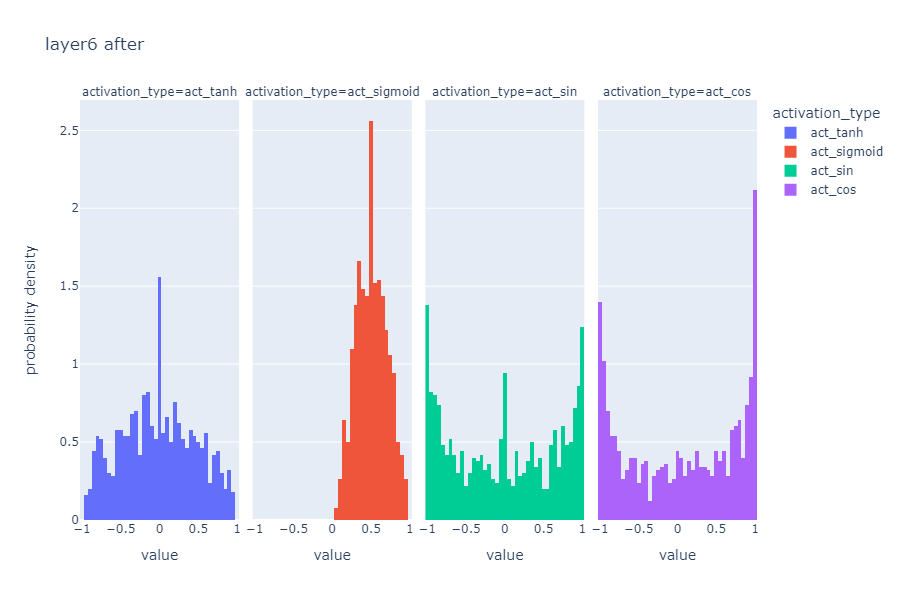

In [8]:
man.init_01(x);

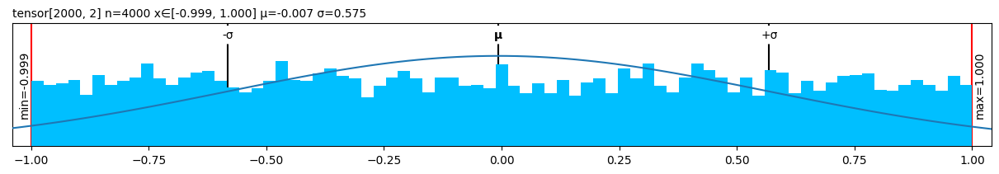

In [9]:
x.plt

Input to the network


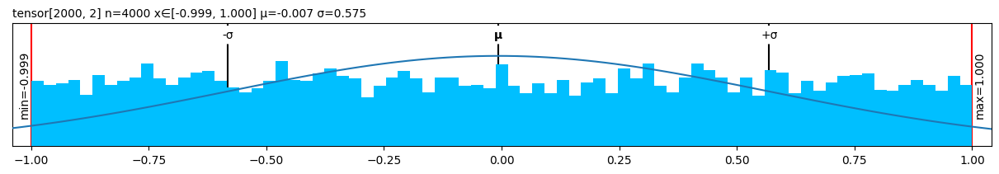

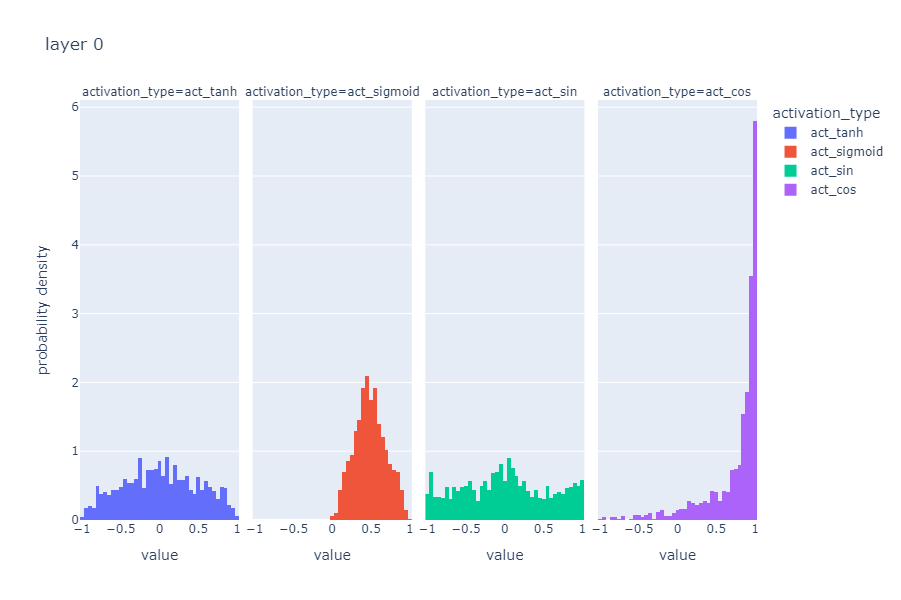

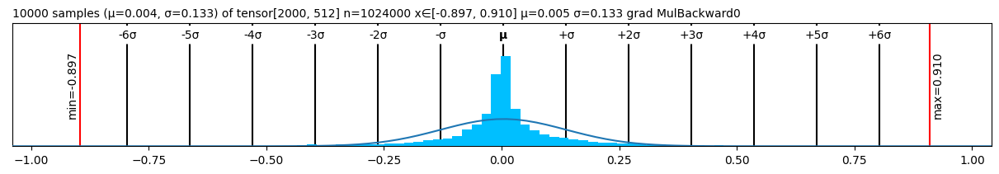

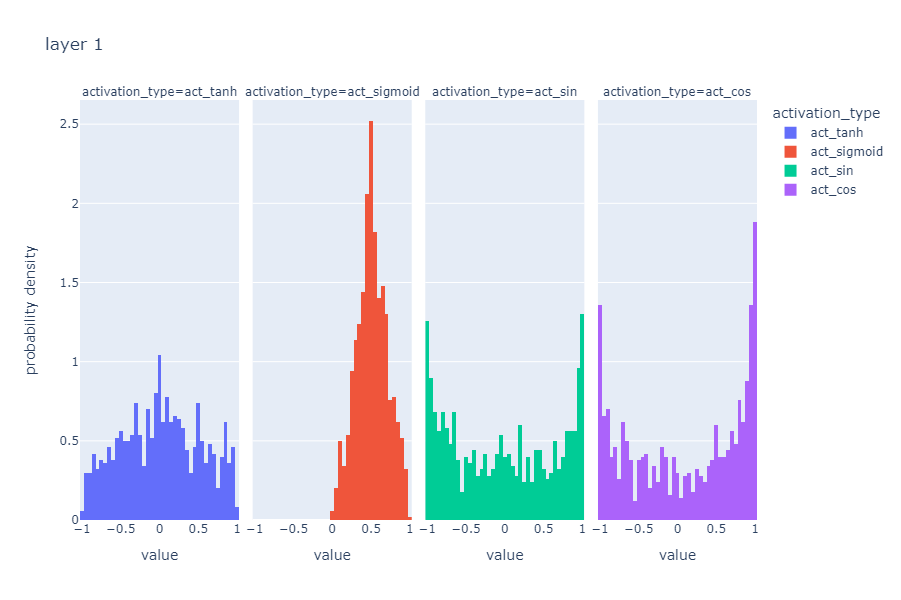

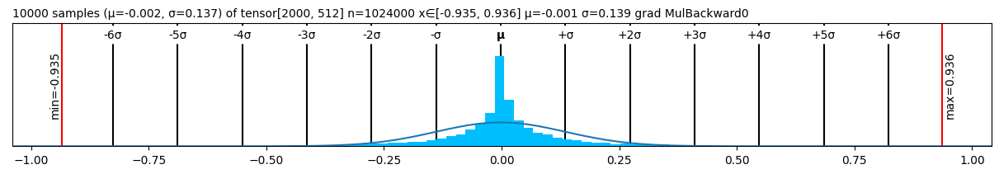

...

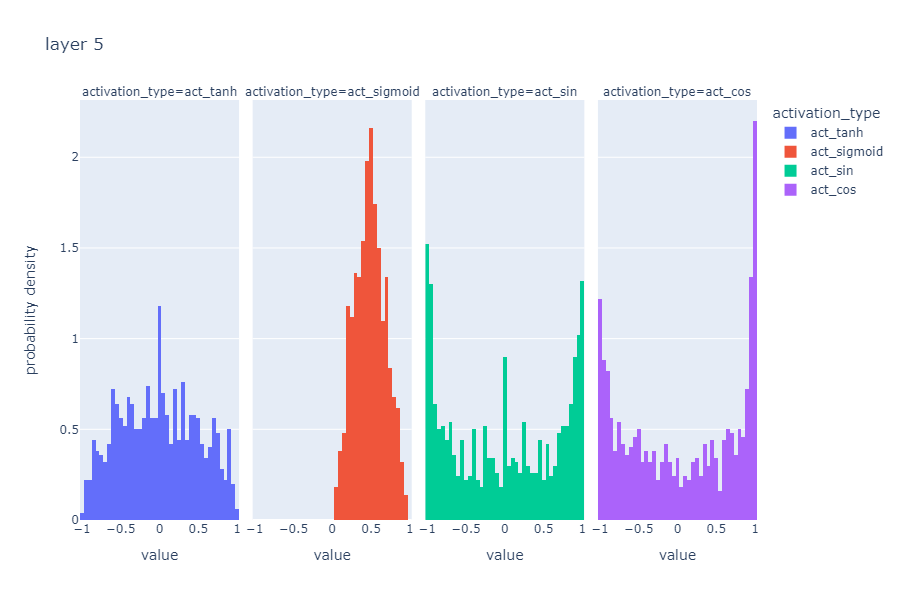

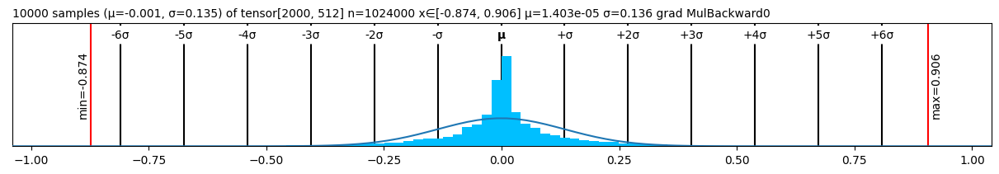

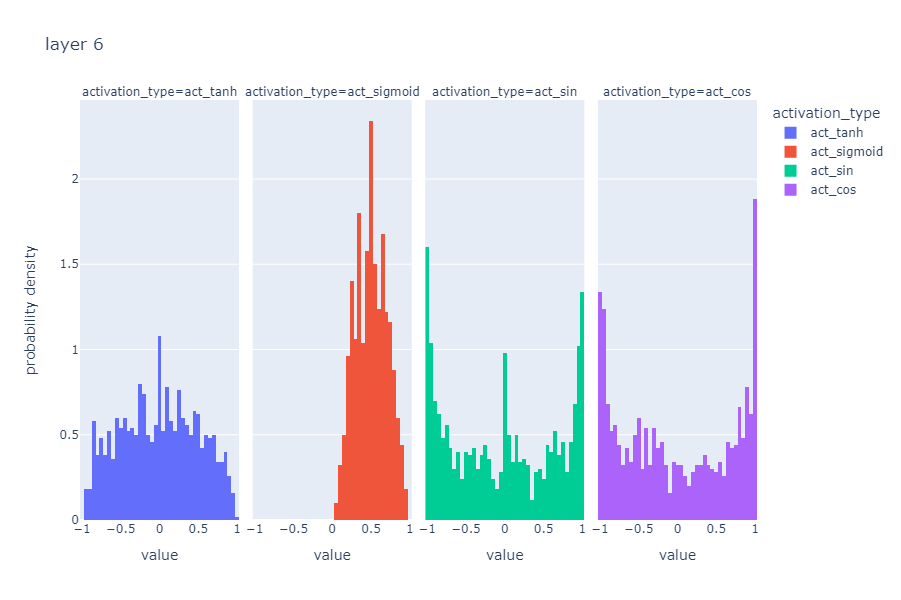

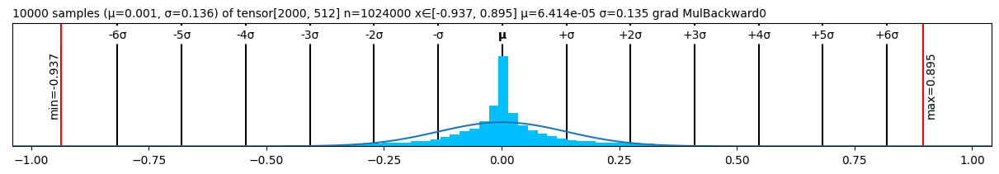

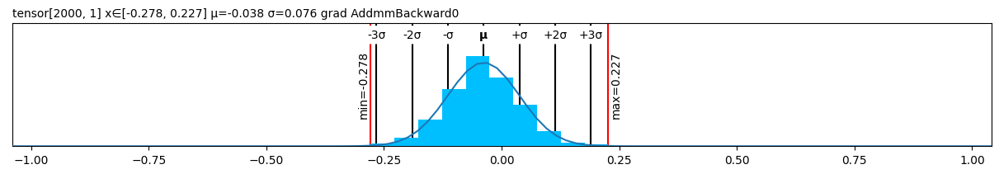

In [10]:
man.plot_activations(x)

In [11]:
break

SyntaxError: 'break' outside loop (668683560.py, line 4)

# uber_init_01

In [ ]:
def _init_splitnet_layer_00(*shape, device='cpu', tanh_gain = 1.137, sigmoid_gain = 1.65):
    W = torch.randn(*shape, device=device)
    fan_in = W.shape[1]
    fan_out = W.shape[0]
    assert fan_out % 4 == 0

    cs = fan_out//4 # chunk size
    W[:cs] = torch.randn_like(W[:cs]) * tanh_gain / (fan_in)**0.5
    W[cs:cs*2] = torch.randn_like(W[:cs]) * sigmoid_gain / (fan_in)**0.5
    return W

In [ ]:
out, intermediate_acts = net.forward_with_activations(x)

In [ ]:
out, acts = intermediate_acts[1]
x, preact, preact_tanh, preact_sigmoid, preact_sin, preact_cos, act_tanh, act_sigmoid, act_sin, act_cos = acts

In [ ]:
layer = model.net[1]
layer(x)

In [ ]:
layer.linear.bias.data = 1e-6 * torch.randn_like(layer.linear.bias.data)

In [ ]:
desired_tanh_std, desired_sigmoid_std = 0.5, 0.2

In [ ]:
tanh_gain = 1.137
sigmoid_gain = 1.65

In [ ]:
cfg = {
    'search_interval': [0, 20],
}

f = lambda tanh_gain: get_stds(layer, x, tanh_gain=tanh_gain)[0] - desired_tanh_std
tanh_gain = rootfinding_init(f, cfg)

f = lambda sigmoid_gain: get_stds(layer, x, tanh_gain=tanh_gain, sigmoid_gain=sigmoid_gain)[1] - desired_sigmoid_std
sigmoid_gain = rootfinding_init(f, cfg)

In [ ]:
x = U(1000, 2)

In [ ]:
h = x

for layer in net.net[:-1]:
    print('before')
    h_tmp = layer(h)
    display(h_tmp.plt)
    
    layer.linear.bias.data = 1e-6 * torch.randn_like(layer.linear.bias.data)
    f = lambda tanh_gain: get_stds(layer, h, tanh_gain=tanh_gain)[0] - desired_tanh_std
    tanh_gain = rootfinding_init(f, cfg)

    f = lambda sigmoid_gain: get_stds(layer, h, tanh_gain=tanh_gain, sigmoid_gain=sigmoid_gain)[1] - desired_sigmoid_std
    sigmoid_gain = rootfinding_init(f, cfg)
    
    print('after')
    h_tmp = layer(h)
    display(h_tmp.plt)
    h = h_tmp

In [ ]:
x = U(1000, 2)

In [ ]:

model = UberNet(hidden_layers=3)


In [ ]:
out, intermediate_acts = model.forward_with_activations(x)
x = intermediate_acts[0][0]
print('Input to the network')
display(x.plt)
for layer_i, interim in enumerate(intermediate_acts):
    out, acts = interim
    if len(acts) > 0:
        plot_acts(acts, title=f'layer {layer_i}')
    display(out.plt)

In [ ]:
h = U(1000, 2)

for layer in model.net[:-1]:
    print('before')
    h_tmp = layer(h)
    display(h_tmp.plt)
    
    layer.linear.bias.data = 1e-6 * torch.randn_like(layer.linear.bias.data)
    f = lambda tanh_gain: get_stds(layer, h, tanh_gain=tanh_gain)[0] - desired_tanh_std
    tanh_gain = rootfinding_init(f, cfg)

    f = lambda sigmoid_gain: get_stds(layer, h, tanh_gain=tanh_gain, sigmoid_gain=sigmoid_gain)[1] - desired_sigmoid_std
    sigmoid_gain = rootfinding_init(f, cfg)
    
    print('after')
    h_tmp = layer(h)
    display(h_tmp.plt)
    h = h_tmp